# Exploração dos dados encontrados no dataset de áudio e no .csv

Este notebook de exploração dos dados tem o objetivo de analisar :
 
*   O arquivo .csv contendo os metadados sobre o áudio da tosse, e fazer uma breve associação quanto a classe do áudio descrita pelo .csv e o áudio em si.
*   Analisar a variável cough_detected quanto a importância da utilização no nosso projeto.
*   Uma analise manual da transformação do áudio em imagem pelo spectograma e pelo Mel Spectograma.



Importando as bibliotecas necessárias


In [ ]:
import numpy as np
import pandas as pd

In [ ]:
df = pd.read_csv('public_dataset/metadata_compiled.csv')

In [ ]:
df

,uuid,datetime,cough_detected,latitude,longitude,age,gender,respiratory_condition,fever_muscle_pain,status,...,quality_3,dyspnea_3,wheezing_3,stridor_3,choking_3,congestion_3,nothing_3,cough_type_3,diagnosis_3,severity_3
0,00039425-7f3a-42aa-ac13-834aaa2b6b92,2020-04-13T21:30:59.801831+00:00,0.9609,31.3,34.8,15.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0009eb28-d8be-4dc1-92bb-907e53bc5c7a,2020-04-12T04:02:18.159383+00:00,0.9301,40.0,-75.1,34.0,male,True,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012c608-33d0-4ef7-bde3-75a0b1a0024e,2020-04-15T01:03:59.029326+00:00,0.0482,-16.5,-71.5,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001328dc-ea5d-4847-9ccf-c5aa2a3f2d0f,2020-04-13T22:23:06.997578+00:00,0.9968,NaN,NaN,21.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001c85a8-cc4d-4921-9297-848be52d4715,2020-04-17T15:24:35.822355+00:00,0.0735,40.6,-3.6,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20067,fff13fa2-a725-49ef-812a-39c6cedda33d,2020-04-13T17:51:36.956822+00:00,0.7154,31.9,34.7,21.0,male,True,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20068,fff3ff61-2387-4139-938b-539db01e6be5,2020-06-28T21:28:21.530881+00:00,0.5257,51.6,-0.2,NaN,female,False,False,symptomatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20069,fff474bf-39a4-4a61-8348-6b992fb5e439,2020-04-10T05:10:36.787070+00:00,0.1945,-39.0,-68.1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20070,fffaa9f8-4db0-46c5-90fb-93b7b014b55d,2020-04-13T18:58:26.954663+00:00,0.0243,41.0,28.8,50.0,male,True,True,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Exemplos de aúdios em relação a cada classe associada pelo .csv

## NaN

In [ ]:
import IPython

IPython.display.Audio("public_dataset/fffce9f0-a5e8-4bee-b13b-c671aac4a61c.wav")

In [ ]:
import IPython

IPython.display.Audio("public_dataset/fff474bf-39a4-4a61-8348-6b992fb5e439.wav")

## COVID-19

In [ ]:
import IPython

IPython.display.Audio("public_dataset/00357712-dd5a-4c0a-90a4-39f1f4b9d5fd.wav")

In [ ]:
import IPython

IPython.display.Audio("public_dataset/ff8363d2-016d-4738-9499-4c62480886fb.wav")

## Healthy

In [ ]:
import IPython

IPython.display.Audio("public_dataset/0009eb28-d8be-4dc1-92bb-907e53bc5c7a.wav")

In [ ]:
import IPython

IPython.display.Audio("public_dataset/ffedc843-bfc2-4ad6-a749-2bc86bdac84a.wav")

## Symptomatic

In [ ]:
import IPython

IPython.display.Audio("public_dataset/0029d048-898a-4c70-89c7-0815cdcf7391.wav")

In [ ]:
import IPython

IPython.display.Audio("public_dataset/ffbeb867-cdb7-4226-9456-e74c80acf2d9.wav")

## Outros

In [ ]:
import IPython

IPython.display.Audio("public_dataset/001d8e33-a4af-4edb-98ba-b03f891d9a6c.wav")

# Distribuição
Nesta sessão foi elaborada algumas filtragens das features do .csv quanto as classes (COVID-19, healthy e symptomatic).

Para a classe COVID-19, existem 1010 amostras com o status igual a COVID-19

In [ ]:
df[df.iloc[:,9] == 'COVID-19']

,uuid,datetime,cough_detected,latitude,longitude,age,gender,respiratory_condition,fever_muscle_pain,status,...,quality_3,dyspnea_3,wheezing_3,stridor_3,choking_3,congestion_3,nothing_3,cough_type_3,diagnosis_3,severity_3
5,001d8e33-a4af-4edb-98ba-b03f891d9a6c,2020-05-13T01:27:42.552773+00:00,0.0306,13.8,-89.6,NaN,female,False,True,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14,00357712-dd5a-4c0a-90a4-39f1f4b9d5fd,2020-04-10T12:48:17.554497+00:00,0.0576,46.8,6.6,NaN,male,True,False,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
71,00e0a33c-6561-406e-b543-4c9f07b860f7,2020-04-15T07:01:51.945775+00:00,0.2798,NaN,NaN,NaN,other,False,False,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
101,015576c8-2b03-4dcb-b251-78a984fe86fe,2020-06-22T00:21:42.091345+00:00,0.9944,NaN,NaN,27.0,male,False,False,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
104,015ec831-e765-44ee-aefc-10dfd95dec78,2020-04-14T03:28:58.264739+00:00,0.9208,41.6,2.0,34.0,male,True,True,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19988,fee168b1-58b4-45ba-b2aa-f30d13e4af2f,2020-04-13T15:31:11.218368+00:00,0.5634,41.9,60.2,NaN,female,False,True,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20025,ff68cc55-6fb0-4d41-831f-3642511ad303,2020-05-25T01:33:01.751072+00:00,0.5984,-13.0,-38.5,NaN,female,False,False,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20034,ff8363d2-016d-4738-9499-4c62480886fb,2020-07-12T08:22:56.853133+00:00,0.9933,NaN,NaN,NaN,female,False,False,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20049,ffbca476-8b35-4797-bc8a-b7f0a2f24b55,2020-04-11T18:42:24.065752+00:00,0.7466,41.0,28.6,NaN,female,False,False,COVID-19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Para a classe healthy, existem 8562 amostras com o status igual a healthy

In [ ]:
df[df.iloc[:,9] == 'healthy']

,uuid,datetime,cough_detected,latitude,longitude,age,gender,respiratory_condition,fever_muscle_pain,status,...,quality_3,dyspnea_3,wheezing_3,stridor_3,choking_3,congestion_3,nothing_3,cough_type_3,diagnosis_3,severity_3
0,00039425-7f3a-42aa-ac13-834aaa2b6b92,2020-04-13T21:30:59.801831+00:00,0.9609,31.3,34.8,15.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0009eb28-d8be-4dc1-92bb-907e53bc5c7a,2020-04-12T04:02:18.159383+00:00,0.9301,40.0,-75.1,34.0,male,True,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001328dc-ea5d-4847-9ccf-c5aa2a3f2d0f,2020-04-13T22:23:06.997578+00:00,0.9968,NaN,NaN,21.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0028b68c-aca4-4f4f-bb1d-cb4ed5bbd952,2020-05-24T12:12:46.394647+00:00,0.8937,NaN,NaN,28.0,female,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,00291cce-36a0-4a29-9e2d-c1d96ca17242,2020-04-13T15:10:58.405156+00:00,0.9883,39.4,67.2,15.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20064,ffe5e2a4-ef67-464d-b1cd-b0e321f6a2dd,2020-04-22T05:40:51.730942+00:00,0.5591,13.0,77.6,26.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20065,ffedc843-bfc2-4ad6-a749-2bc86bdac84a,2020-06-05T03:41:37.481463+00:00,0.9498,-34.5,-58.5,23.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20066,ffeea120-92a4-40f9-b692-c3865c7a983f,2020-05-02T10:18:27.348859+00:00,0.9784,14.3,121.1,22.0,female,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20067,fff13fa2-a725-49ef-812a-39c6cedda33d,2020-04-13T17:51:36.956822+00:00,0.7154,31.9,34.7,21.0,male,True,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Para a classe symptomatic, existem 1742 amostras com o status igual a symptomatic

In [ ]:
df[df.iloc[:,9] == 'symptomatic']

,uuid,datetime,cough_detected,latitude,longitude,age,gender,respiratory_condition,fever_muscle_pain,status,...,quality_3,dyspnea_3,wheezing_3,stridor_3,choking_3,congestion_3,nothing_3,cough_type_3,diagnosis_3,severity_3
9,0029d048-898a-4c70-89c7-0815cdcf7391,2020-07-16T03:01:55.059762+00:00,0.9456,NaN,NaN,35.0,male,True,False,symptomatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,00432f00-2477-4faf-a440-cc1276065b4a,2020-04-30T11:01:13.536686+00:00,0.6911,48.9,2.6,31.0,female,True,False,symptomatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34,006d8d1c-2bf6-46a6-8ef2-1823898a4733,2020-04-22T10:24:21.408615+00:00,0.2677,NaN,NaN,28.0,male,True,True,symptomatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
48,008c1c9e-aeef-40c5-846c-24f1b964f884,2020-04-12T21:25:00.131353+00:00,0.9751,48.9,2.7,44.0,male,False,False,symptomatic,...,good,False,False,False,False,False,True,wet,healthy_cough,pseudocough
68,00ce5b06-c302-4387-bbd7-86355a4a8c12,2020-04-13T20:14:58.986747+00:00,0.9900,5.1,-73.6,41.0,female,True,False,symptomatic,...,good,True,False,False,False,False,False,dry,upper_infection,severe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20017,ff49f6b7-fa54-4780-a4be-b0594e628aae,2020-04-14T03:37:40.338837+00:00,0.9540,41.4,60.4,17.0,female,False,True,symptomatic,...,good,False,False,False,False,False,True,wet,lower_infection,severe
20023,ff5f97db-9b64-4e35-afe8-af463d5c2c60,2020-04-18T20:27:04.557378+00:00,0.7858,48.9,2.3,49.0,male,False,True,symptomatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20052,ffbeb867-cdb7-4226-9456-e74c80acf2d9,2020-04-25T01:42:52.162671+00:00,0.9647,NaN,NaN,30.0,male,False,False,symptomatic,...,good,False,False,False,False,False,True,wet,upper_infection,mild
20063,ffe13fcf-c5c2-4a6a-a9fc-e010f4f033c1,2020-04-13T21:08:50.708320+00:00,0.9485,41.1,28.8,31.0,male,False,False,symptomatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Filtragem pela variável cough_detected 

Essa variável disponível na base entrega uma análise pré-processada para saber a probabilidade do áudio se tratar de um som de tosse.

Para tanto áudios com o valor 0.0 possuem 0% de probabilidade de ser relacionado a uma tosse.  O maior valor para esta variável encontrada na base foi de 0.9994.

Logo, não iremos considerar nas análises posteriores registros com cough_detected menores ou iguais a 0.5 (maior chance de não serem áudios de tosse). 

In [ ]:
df[df.iloc[:, 2] == 0.0]

,uuid,datetime,cough_detected,latitude,longitude,age,gender,respiratory_condition,fever_muscle_pain,status,...,quality_3,dyspnea_3,wheezing_3,stridor_3,choking_3,congestion_3,nothing_3,cough_type_3,diagnosis_3,severity_3
773,0a102ef5-4ede-47c8-8d51-a813d7631eda,2020-04-12T06:07:13.426826+00:00,0.0,-21.0,55.7,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2140,1b4b2bc1-3ec9-4cb5-8ee1-31d37061128b,2020-04-09T18:08:17.769371+00:00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2484,1fa6ac75-9fe4-4927-bbbe-60e06ff36882,2020-04-01T20:10:25.395852+00:00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2538,20888c28-5121-42b2-97d8-0c5175c41232,2020-04-22T17:38:36.639791+00:00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2763,23784907-ffd8-42ec-b743-4b74799d0e3c,2020-04-03T07:50:23.898473+00:00,0.0,NaN,NaN,62.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2794,23d4e58d-c7e4-44d9-9f34-9889a6121f6c,2020-04-14T18:05:38.718053+00:00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2931,257c54fd-45a5-430c-8c8a-63c7d8d5d74a,2020-04-19T17:50:55.622808+00:00,0.0,NaN,NaN,30.0,male,False,False,symptomatic,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3350,2af98a92-3cd8-43ae-9493-7cddf0075edf,2020-04-03T07:47:30.545084+00:00,0.0,NaN,NaN,62.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4371,373694f0-aace-45ef-a523-dd65796a3615,2020-04-13T18:44:37.679904+00:00,0.0,NaN,NaN,25.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5313,432f54d8-937e-4113-9b42-bdc7b1a20e3e,2020-04-13T02:25:10.550953+00:00,0.0,NaN,NaN,26.0,male,False,False,healthy,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


O maior valor da variável cough_detection é 0.9994.

In [ ]:
np.max(df.iloc[:, 2].values)

0.9994

A seguir temos um exemplo de um áudio com 10 segundos de duração porém sem nenhum som perceptível. 

In [ ]:
import IPython

IPython.display.Audio("public_dataset/2af98a92-3cd8-43ae-9493-7cddf0075edf.wav")

# Análise manual do aúdio para estudo da base

Nesta seção podemos encontrar uma transformação visual de um áudio quanto a amplitude do sinal e também em relação a amplitude pela frequencia do sinal.

In [ ]:
import librosa

In [ ]:
y, src = librosa.load('public_dataset/001d8e33-a4af-4edb-98ba-b03f891d9a6c.wav')

[]

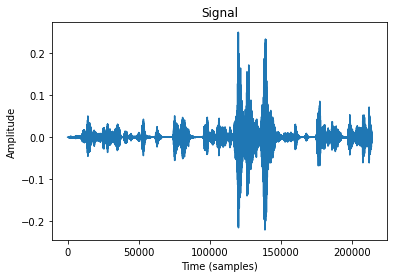

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(y)
plt.title('Signal')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.plot()

Text(0, 0.5, 'Amplitude')

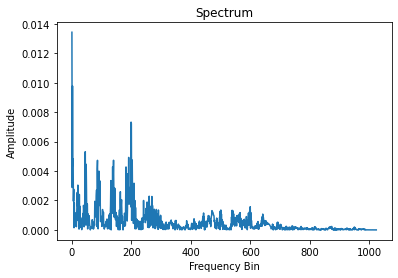

In [ ]:
import numpy as np

n_fft = 2048
ft = np.abs(librosa.stft(y[:n_fft], hop_length = n_fft+1))
plt.plot(ft)
plt.title('Spectrum')
plt.xlabel('Frequency Bin')
plt.ylabel('Amplitude')

A seguir temos uma visualização do áudio pelo Mel-Spectrogram. Onde temos os spectograma com as frequencias convertidas para a escala mel. 

Para a continuidade do projeto, transformaremos os áudios através do mel-spectograma e analiseremos quanto a sua imagem.

/home/gabriel/.local/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/gabriel/.local/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/home/gabriel/.local/lib/python3.8/site-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


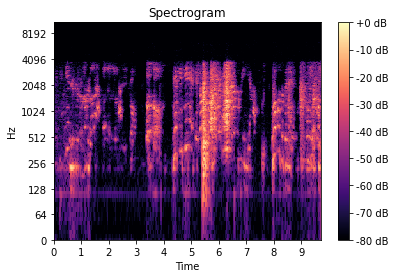

In [ ]:
import librosa.display
spec = np.abs(librosa.stft(y, hop_length=512))
spec = librosa.amplitude_to_db(spec, ref=np.max)
librosa.display.specshow(spec, sr=src, x_axis='time', y_axis='log');
plt.colorbar(format='%+2.0f dB');
plt.title('Spectrogram');

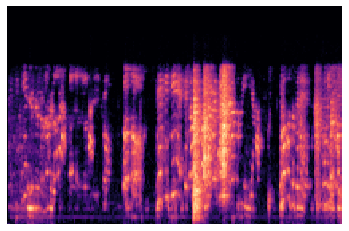

In [ ]:
mel_spect = librosa.feature.melspectrogram(y=y, sr=src, n_fft=2048, hop_length=1024)
mel_spect = librosa.power_to_db(mel_spect, ref=np.max)
librosa.display.specshow(mel_spect, y_axis='mel', fmax=8000, x_axis='time')
plt.title('Mel Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.axis('off')
plt.savefig('teste.jpg')